In [1]:
import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cooler
import bioframe
import cooltools
from cooltools.lib import plotting
import cooler as clr
import h5py
import coolbox
from coolbox.api import *
from coolbox.utilities import GenomeRange
from pygenometracks import readBed, readGtf
from pygenometracks.tracks import BedTrack

import glob
from pathlib import Path


%cd /home/varshini/uc_analyses/
import utils, coolbox_helpers
%cd /home/varshini/LoopCall_Analysis_Scripts
import re

warnings.filterwarnings("ignore")

import logging
logging.getLogger('matplotlib.font_manager').disabled = True
from matplotlib.backends.backend_pdf import PdfPages

/home/varshini/uc_analyses
/home/varshini/LoopCall_Analysis_Scripts


In [2]:
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 12

plt.rcParams.update({
    "text.usetex": False})
plt.rc('pdf',fonttype = 42)

In [3]:
def make_region_plot_mod(region, resolution, microc_file,
                     bw_list, condition_order, gene_annot_name, bedgraph_fname=None, plot_variants=False,
                     file_bottom=None, cmap_chip='tab10', bigwig_bins=1600, autoscale=True, plot_bed=False,
                        variant_track_height=2, custom_valranges=None, plot_genes=True):
    
    """
    Function that makes a plot of a region with Micro-C, ChIP-seq, and Pro-seq.
    
    region: (str) string that specifies region for plotting.
    resolution: (int) resolution of micro-c map used
    highlight_region_list: List of regions of format [chr, start, end] to highlight
    microc_file: (str) file path to micro-c data
    microc_title: (str) title for micro-c
    chip_list_list: List of lists containing paths to bigwigs
    forward_proseq_list: List of paths to forward strand pro-seq files
    reverse_proseq_list: List of paths to reverse strand pro-seq files
    condition_order: List indicating order of conditions to plot. 
    """
    print(region, resolution, microc_file)
    heatmap = Cool(microc_file, file_bottom=file_bottom, resolution=resolution, **MICROC_PLOTTING_PARAMS) 
    frame = heatmap + Spacer(SPACER_HEIGHT*3)
    if plot_bed:
        frame+=NewBed(*BED_PARAMS) + TrackHeight(3) + Spacer(SPACER_HEIGHT)
    #frame +=  BED(finemapped_variant_name, border_only=True, 
    #              alpha=0.1, show_score='yes', linewidth=0.5, display="collapsed", height=1, edgecolor="#0099BB") + Spacer(SPACER_HEIGHT)
    if len(bw_list)>0:
        bigwig_list = coolbox_helpers.make_bigwig_list(bw_list, region, condition_order, autoscale=False)
        cmap_arr = sns.color_palette(cmap_chip, n_colors=len(bigwig_list))

        for i, bigwig in enumerate(bigwig_list):
            if autoscale:
                frame += coolbox_helpers.auto_scale_bigwig(bigwig, region) + Color(cmap_arr[i]) + Spacer(SPACER_HEIGHT)
            else:
                frame += bigwig + MaxValue(custom_valranges[i]) + MinValue(0) + Color(cmap_arr[i]) + Spacer(SPACER_HEIGHT)

    if bedgraph_fname is not None:
        frame += BigWig(bedgraph_fname) + Title("HbF_Base") + Color("#EE7733") + MaxValue(30) + MinValue(0)+ Spacer(SPACER_HEIGHT)
    
    if plot_variants:
        frame+=SNP(finemapped_variant_name, **VARIANTS_PARAMS) \
        + HLines(0, line_width=2, line_style='-',color='k') + Title("HbF GWAS [-log10(p)]")  + TrackHeight(variant_track_height) + Spacer(SPACER_HEIGHT)
    
    if plot_genes:
        annotations = NewBed(*GTF_PARAMS)
#     annotations = GTF(gene_annot_name, color=["#000000"], gene_rows=1, 
#                       filter_named_genes=True, row_filter=None) 
        frame+=annotations

    return frame


def multiplot(mcool1, mcool2, peaks, resolution=5000):
    for index, row in peaks.iterrows():
        plt.figure()
        region_str = get_locus_from_coord(row, flank=200_000)

        # Reverse these
        microc_file1 = mcool1
        microc_file2 = mcool2
        microc_title = f"{region_str} at {resolution}"
        heatmap = Cool(microc_file1, file_bottom=microc_file2,
                       resolution=resolution, **MICROC_PLOTTING_PARAMS) + Title(microc_title)
        frame = heatmap
        annotations = NewBed(*ANNOTATIONS_PARAMS)
        frame += annotations
        frame += XAxis()
        fig = frame.plot(region_str)



In [4]:
class ChromName(Track):
    """
    Track for show chromosome name.

    Parameters
    ----------
    fontsize : float
        Font name to show.

    offset : float
        Offset ratio to the start position.
    """

    DEFAULT_PROPERTIES = {
        "fontsize": 50,
        "offset": 0.45,
    }

    def __init__(self, **kwargs):
        properties = ChromName.DEFAULT_PROPERTIES.copy()
        properties.update(kwargs)
        super().__init__(properties)

    def fetch_data(self, gr: GenomeRange, **kwargs):
        return gr.chrom  # return chromosome name

    def plot(self, ax, gr: GenomeRange, **kwargs):
        x = gr.start + self.properties['offset'] * (gr.end - gr.start)
        ax.text(x, 0, gr.chrom, fontsize=self.properties['fontsize'])
        ax.set_xlim(gr.start, gr.end)


class NewBed(Track):
    """
    Custom pygenometracks class that allows for control over the aesthetics of gene annotations in
    region plots.
    """

    def __init__(self, coolbox_prop_dict, pygenometracks_prop_dict):
        super().__init__(coolbox_prop_dict)  # init
        self.pygenometracks_object = BedTrack(pygenometracks_prop_dict)

    def fetch_data(self, gr, **kwargs):
        pass

    def plot(self, ax, gr, **kwargs):
        #         x = gr.start + self.properties['offset'] * (gr.end - gr.start)
        #         ax.text(x, 0, gr.chrom, fontsize=self.properties['fontsize'])
        #         ax.set_xlim(gr.start, gr.end)
        self.pygenometracks_object.plot(ax, gr.chrom, gr.start, gr.end)
        ax.set_xlim([gr.start, gr.end])

In [5]:
# define the bigwig and RNAseq files 
base_dir = '/mnt/coldstorage/Varshmallow/'

def get_chip_list(base_dir='/mnt/coldstorage/Varshmallow/', phase=1, phase2=None, 
                  include=['RNASeq', 'ATAC', 'H3K27ac', 'H3K4me1']):

    chip_dict = {}
    chip_dict[f'RNASeq_P{phase}'] = f'{base_dir}Blood_RNAseq/Phase{phase}_RNA_chr.bw'
    
    # ATAC-Seq
    chip_dict[f'ATAC_P{phase}'] = f'{base_dir}Blood_ATAC/Phase{phase}_ATAC.bw'
    
    chip_dict['NIPBL'] = '/mnt/md0/varshini/Analysis/Blood/complete_analyses/bigwigs/GSM8864683_HUDEP-2_NIPBL_rep1_2_mean.bw'
 
    # GATA-1 
    
    
    if phase2 is not None:
        chip_dict[f'ATAC_P{phase2}'] = f'{base_dir}Blood_ATAC/Phase{phase2}_ATAC.bw'
        chip_dict[f'RNASeq_P{phase2}'] = f'{base_dir}Blood_RNAseq/Phase{phase2}_RNA_chr.bw'
        
    # Histone ChIP
    chip_dir = '/mnt/md0/varshini/Analysis/Blood/complete_analyses/bigwigs/'

    directory = os.fsencode(chip_dir)
    
    for file in os.listdir(directory):
        filename = os.fsdecode(file)
        rm = re.match(rf'\w*P{phase}_CTCF\S*', filename)
        if rm is not None:
            chip_dict[f'CTCF_P{phase}'] = f'{chip_dir}{rm.group(0)}'

        rm = re.match(rf'\w*P{phase}_H3K27ac\S*', filename)
        if rm is not None:
            chip_dict[f'H3K27ac_P{phase}']  = f'{chip_dir}{rm.group(0)}'

        rm = re.match(rf'\w*P{phase}_H3K4me1\S*', filename)
        if rm is not None:
            chip_dict[f'H3K4me1_P{phase}'] = f'{chip_dir}{rm.group(0)}'
       
        rm = re.match(r'\w*GATA1\S*', filename)
        if rm is not None:
            chip_dict[f'GATA1'] = f'{base_dir}Blood_ChIP/P{phase}/{rm.group(0)}'
            
        
    if phase2 is not None:
        for file in os.listdir(directory):
            filename = os.fsdecode(file)
            rm = re.match(rf'\w*P{phase2}_CTCF\S*', filename)
            if rm is not None:
                chip_dict[f'CTCF_P{phase2}'] = f'{chip_dir}{rm.group(0)}'

            rm = re.match(rf'\w*P{phase2}_H3K27ac\S*', filename)
            if rm is not None:
                chip_dict[f'H3K27ac_P{phase2}']  = f'{chip_dir}{rm.group(0)}'

            rm = re.match(rf'\w*P{phase2}_H3K4me1\S*', filename)
            if rm is not None:
                chip_dict[f'H3K4me1_P{phase2}'] = f'{chip_dir}{rm.group(0)}'

        
    chip_list = [chip_dict[key] for key in include]
    return chip_list


In [6]:
resolution = 2000
phases_microc = {1: 'Phase1_', 2:'Phase2_dedup',3:'Phase3_dedup'}

phases = ['Phase1_', 'Phase2_dedup', 'Phase3_dedup']
uc_path = '/mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran'
uc_filenames = [os.path.join(uc_path, f"Sankaran_{p}merged.250.mcool") for p in phases]

uc_filenames_comp = ["/mnt/md0/varshini/Analysis/Blood/published_data/li_2023_ery-pro.mcool",
                     "/mnt/md0/varshini/Analysis/Blood/published_data/li_2023_ery-pre.mcool"]
                     
                     
                     
# ery-pre: somewhere between p2 and p3
# ery-pro: p1

In [7]:
GTF_FILENAME = "/mnt/md0/varshini/Gene_Annotations/refSeqSelect.bed"
GRNA = '/mnt/md0/varshini/Analysis/Blood/Tracks_Intersection_Analysis_NewCTCF/hbf_grna.bw'
finemapped_variant_name = '/mnt/md0/varshini/Analysis/Blood/hbf_gwas/METALOUT_inv1.bed'

# Define plotting aesthetics as global variables
HIGHLIGHT_PARAMS = {"color":"gray",
                   "alpha":0.5,
                   "border_line":False}

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-0.5,
                          "min_value":-4.5}

VARIANTS_PARAMS = {
    "col_chrom":0, 
    "col_pos":2,
    "col_pval":6, 
    "threshold":10e-8, 
    "min_value":0, 
    "size":20,
    "alpha":0.75}

SPACER_HEIGHT = 0.4

regions = {
        'compt_ex2': 'chr1:48000000-102000000',
        'compt_ex3': 'chr8:93,846,768-130,070,949',
        'compt_ex3_sub': 'chr8:93,846,768-104,070,949',
        'cpeb4': 'chr5:173570169-174026097',
        'spi1': 'chr11:47,343,511-47,410,593',
        'alpha_globin':'chr16:50000-277,522',
        'ckit': 'chr4:54257267-54940783',
}


GTF_PARAMS = [
     {"height":2},
    {"file":GTF_FILENAME,
     "max_labels":1000,
    #"gene_rows":1,
    "merge_transcripts":True,       #"gene_style":"normal",
    "border_only":"true",
     "color":"#000000"
    }] # PATH TO BED FILE OF GENE ANNOTATIONS

In [8]:
savedir = os.path.join('/mnt/md0/varshini/Analysis/Blood/figs_v4/supp1')

if not os.path.exists(savedir):
    os.mkdir(savedir)

In [35]:
clr = cooler.Cooler(uc_filenames_comp[1])

KeyError: "No cooler found at: /mnt/md0/varshini/Analysis/Blood/published_data/li_2023_ery-pre.mcool. Coolers found in ['/resolutions/1000', '/resolutions/2000', '/resolutions/4000', '/resolutions/5000', '/resolutions/50000']. Use '::' to specify a group path"

chr15:31292203-81292341 50000 /mnt/md0/varshini/Analysis/Blood/published_data/li_2023_ery-pro.mcool
bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


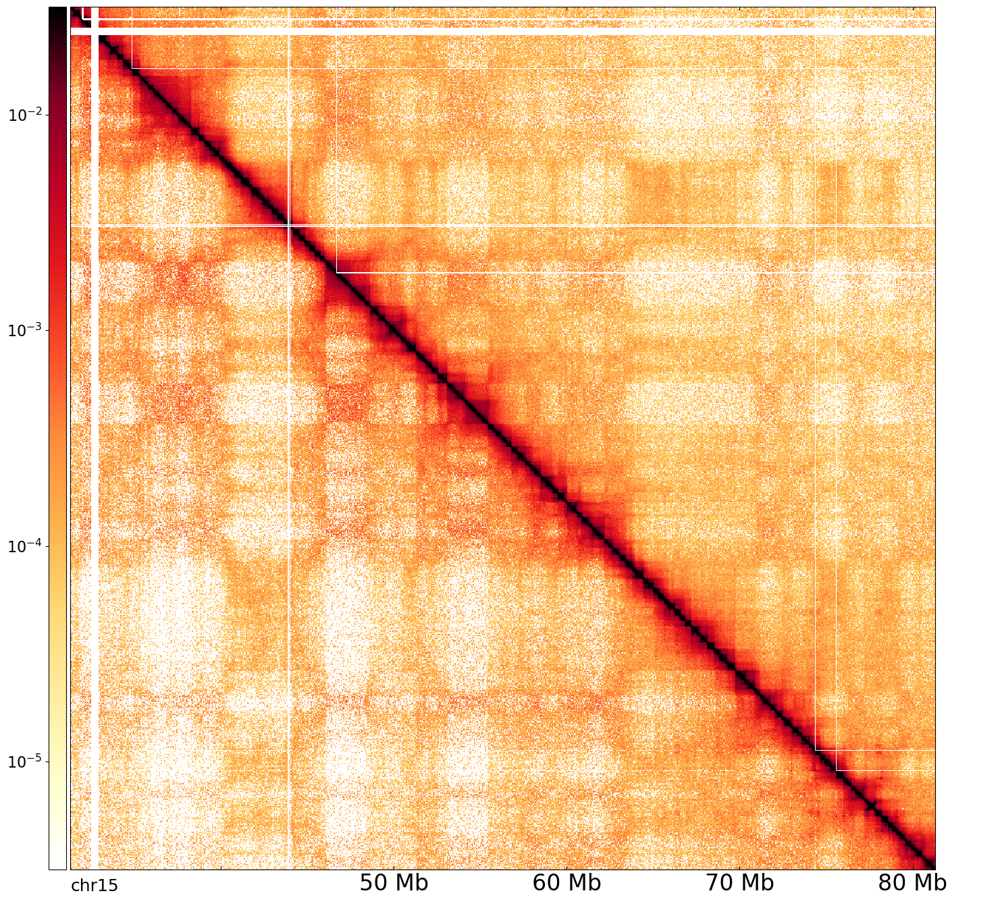

In [67]:
# compartment scale 

incl = []
resolution = 50000

###
region_str ='chr15:31292203-81292341'
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1.5,
                          "min_value":-5.5,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames_comp[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False, file_bottom=uc_filenames_comp[1],
                         cmap_chip="deep", autoscale=False,
                          plot_genes=False)
fig = frame.plot(region_str)
fig.savefig(os.path.join(savedir, "eryProPre_compt.svg"))

fig



chr15:31000000-81000000 50000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool
bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


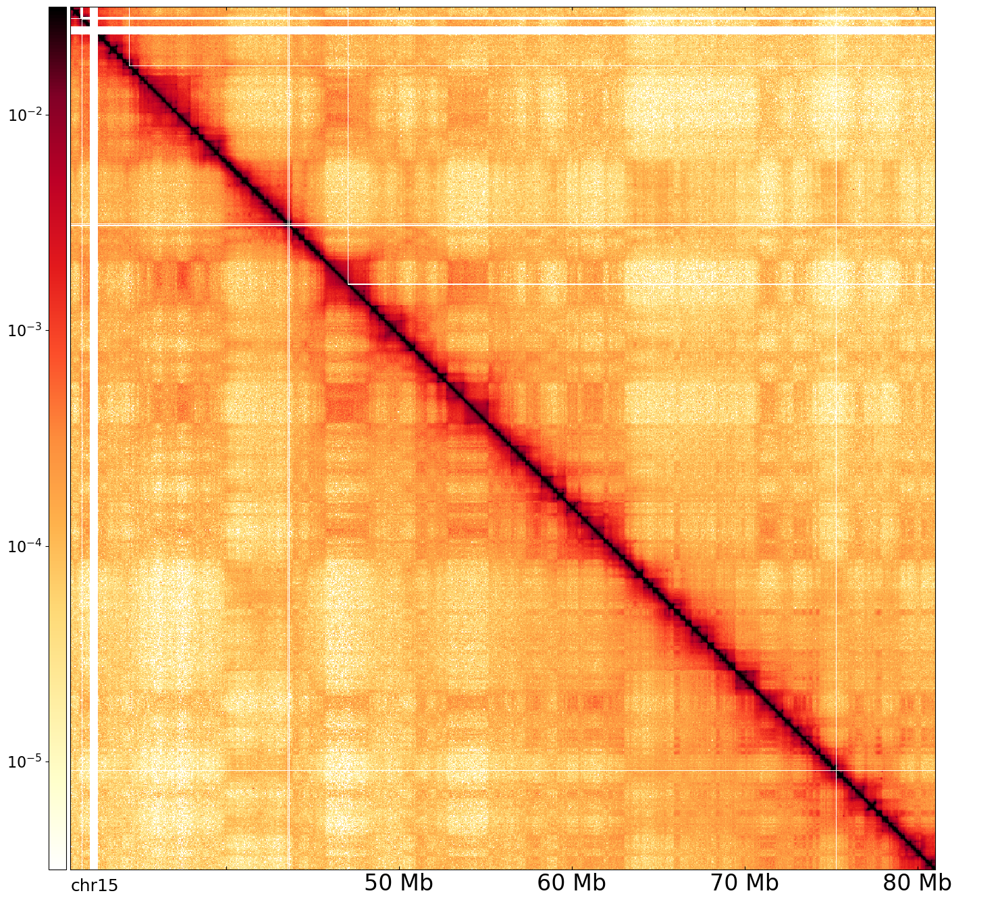

In [68]:
# compartment scale 
###
region_str = 'chr15:31000000-81000000'
GTF_PARAMS[0]["height"] = 3
incl=[]
resolution = 50000
MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                         "max_value":-1.5,
                          "min_value":-5.5,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,file_bottom=uc_filenames[1],
                         cmap_chip="deep", autoscale=True,
                          plot_genes=False)
fig = frame.plot(region_str)
fig.savefig(os.path.join(savedir, "P12_compt.svg"))
fig

chr15:31292203-46292198 50000 /mnt/md0/varshini/Analysis/Blood/published_data/li_2023_ery-pro.mcool
bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


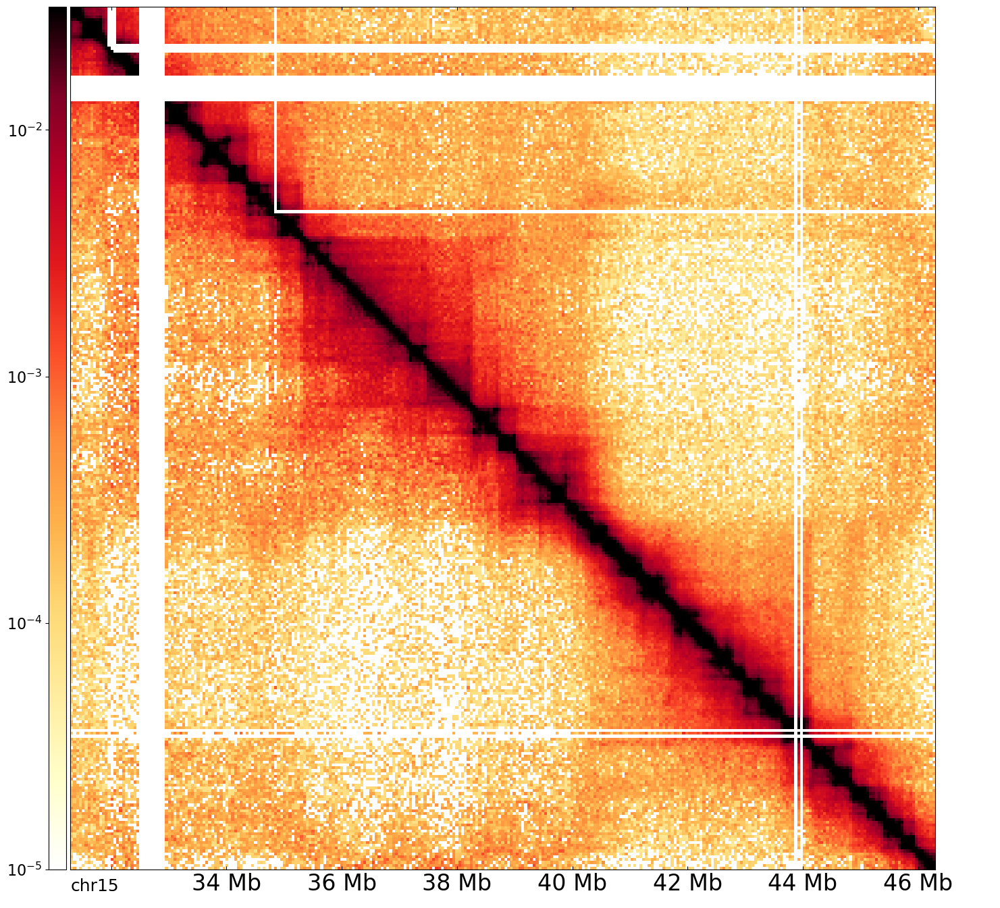

In [69]:
# tad scale
incl = []
resolution = 50000

###
region_str ='chr15:31292203-46292198'
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1.5,
                          "min_value":-5,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames_comp[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False, file_bottom=uc_filenames_comp[1],
                         cmap_chip="deep", autoscale=False,
                          plot_genes=False)
fig = frame.plot(region_str)

fig.savefig(os.path.join(savedir, "eryProPre_tad.svg"))
fig




chr15:31000000-46000000 50000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool
bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


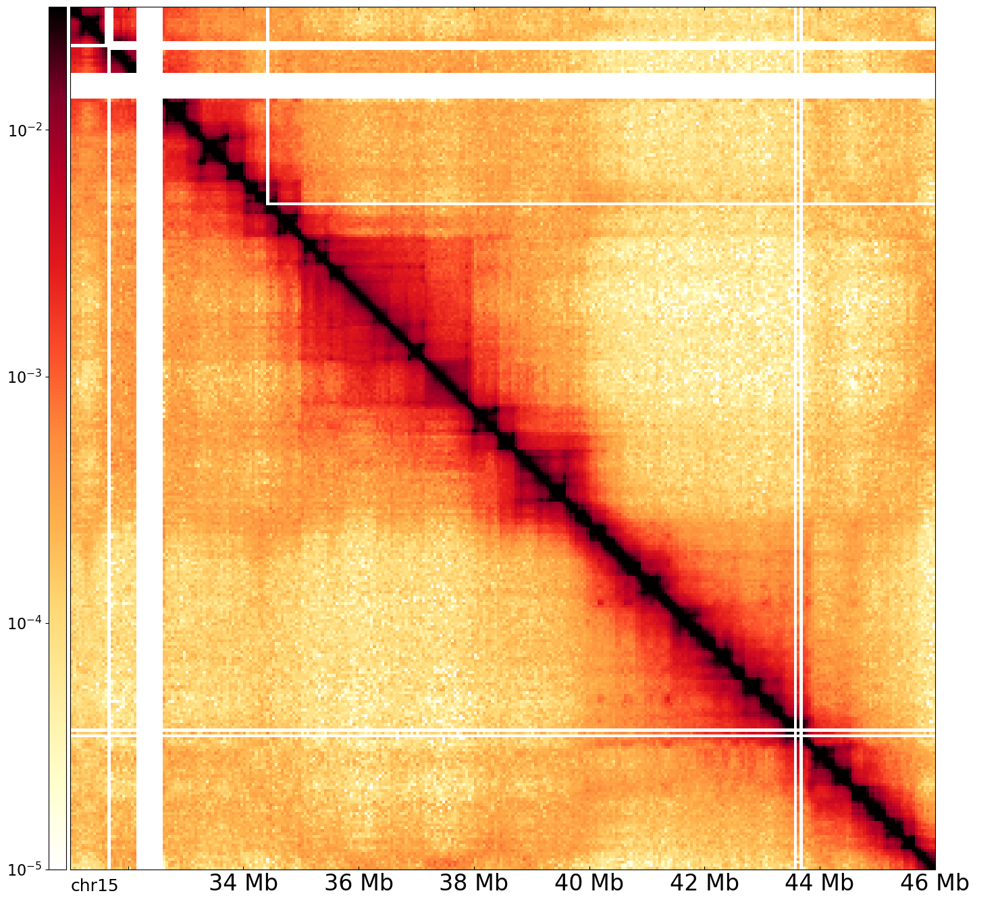

In [70]:
# tad scale

# compartment scale 
###
region_str = 'chr15:31000000-46000000'
GTF_PARAMS[0]["height"] = 3
incl=[]
resolution = 50000
MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                         "max_value":-1.5,
                          "min_value":-5,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,file_bottom=uc_filenames[1],
                         cmap_chip="deep", autoscale=True,
                          plot_genes=False)
fig = frame.plot(region_str)
fig.savefig(os.path.join(savedir, "P12_tad.svg"))
fig

chr15:31442203-31842203 2000 /mnt/md0/varshini/Analysis/Blood/published_data/li_2023_ery-pro.mcool
bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


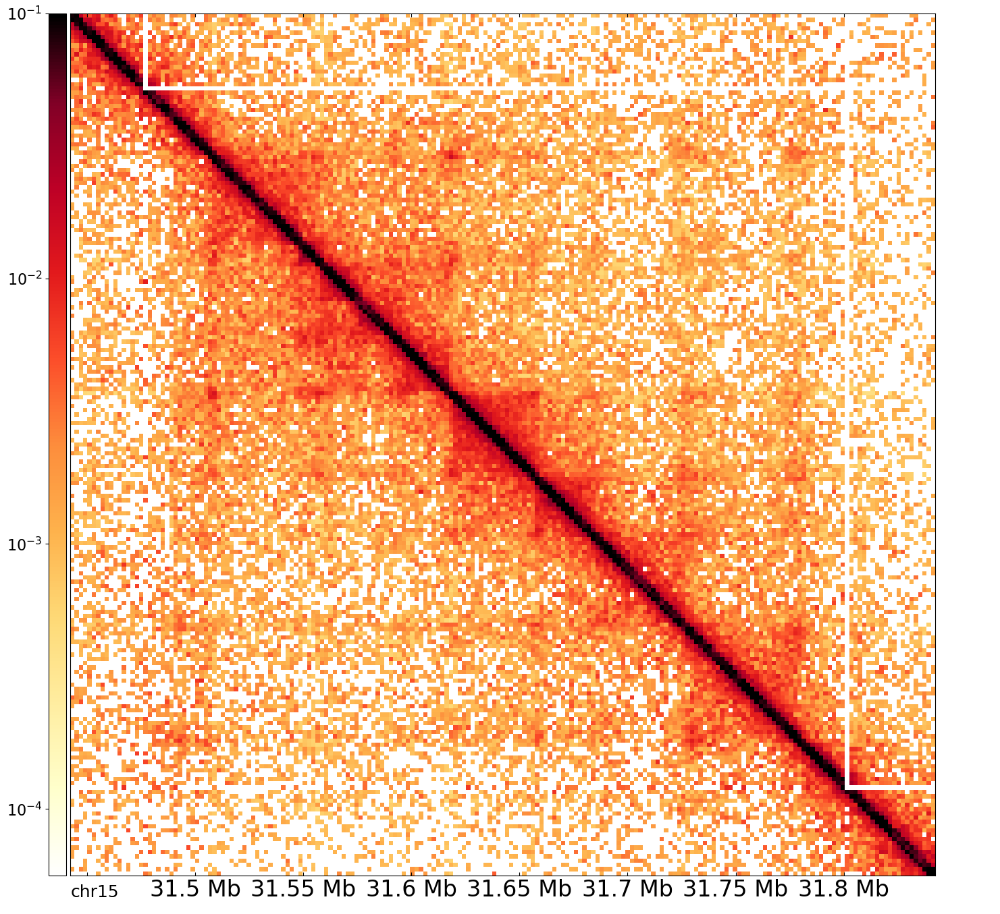

In [57]:
incl = []
resolution=2000

###
region_str ='chr15:31442203-31842203'
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1,
                          "min_value":-4.25,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames_comp[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False, file_bottom=uc_filenames_comp[1],
                         cmap_chip="deep", autoscale=False,
                          plot_genes=False)
fig = frame.plot(region_str)
fig
#fig.savefig(os.path.join(savedir, "eryProPre_klf13.svg"))




chr15:31150000-31550000 2000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool


100%|██████████████████████████████████| 22438/22438 [00:00<00:00, 32865.69it/s]


bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


DEBUG:pygenometracks.tracks.GenomeTrack:ylim 1.08,-0.08


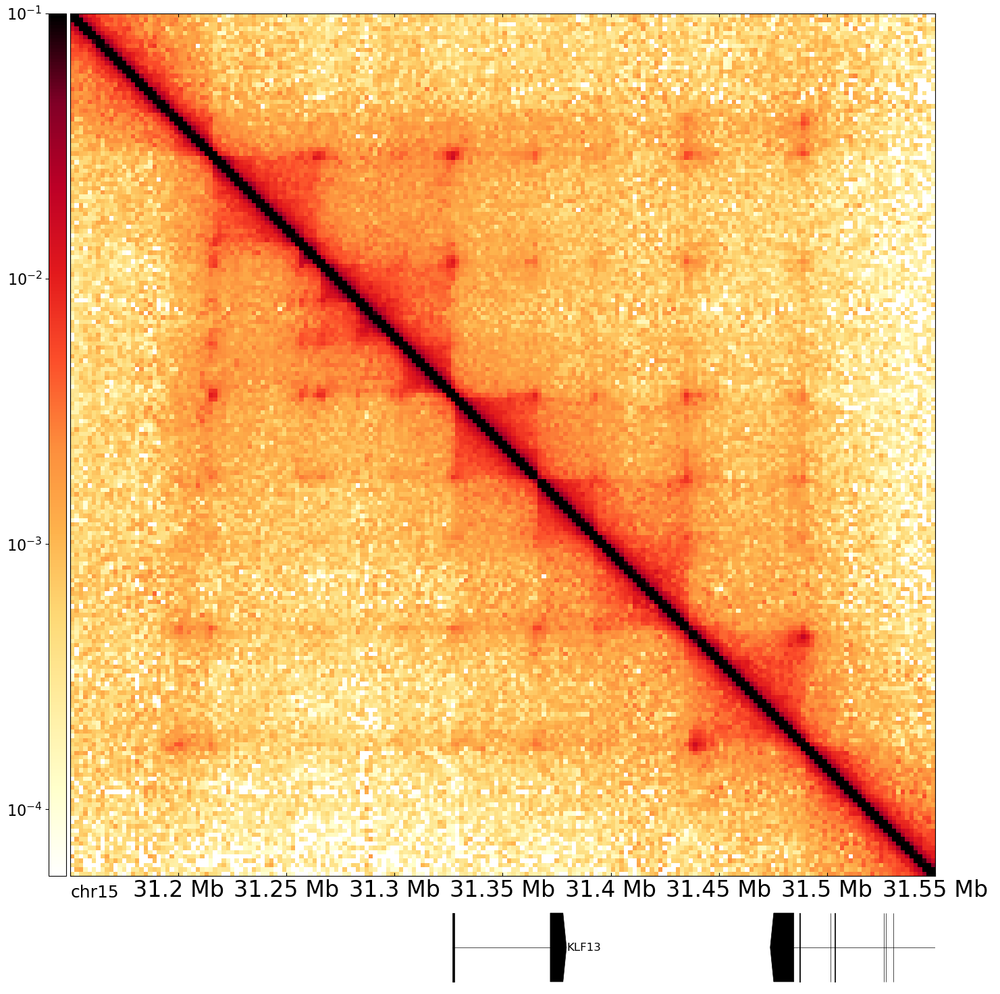

In [60]:
###
region_str = 'chr15:31150000-31550000'
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1,
                          "min_value":-4.25,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,file_bottom=uc_filenames[1],
                         cmap_chip="deep", autoscale=True,
                          plot_genes=True)
fig = frame.plot(region_str)
fig
#fig.savefig(os.path.join(savedir, "P12_klf13.svg"))

chr15:31492203-31642203 1000 /mnt/md0/varshini/Analysis/Blood/published_data/li_2023_ery-pro.mcool
bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


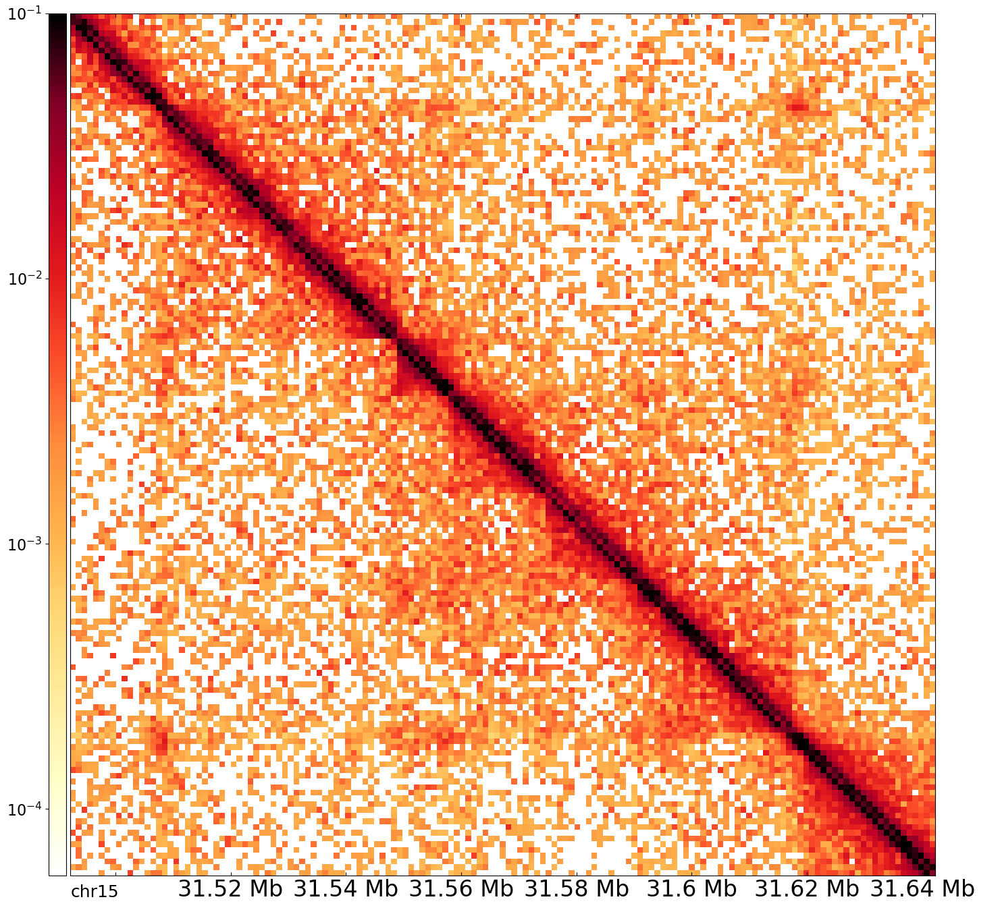

In [62]:
resolution = 1000

region_str = 'chr15:31492203-31642203'
MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1,
                          "min_value":-4.25,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames_comp[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False, file_bottom=uc_filenames_comp[1],
                         cmap_chip="deep", autoscale=False,
                          plot_genes=False)
fig = frame.plot(region_str)
fig
#fig.savefig(os.path.join(savedir, "eryProPre_klf13_inset.svg"))


chr15:31200000-31350000 1000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool


100%|██████████████████████████████████| 22438/22438 [00:01<00:00, 15409.56it/s]


bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


DEBUG:pygenometracks.tracks.GenomeTrack:ylim 1.08,-0.08


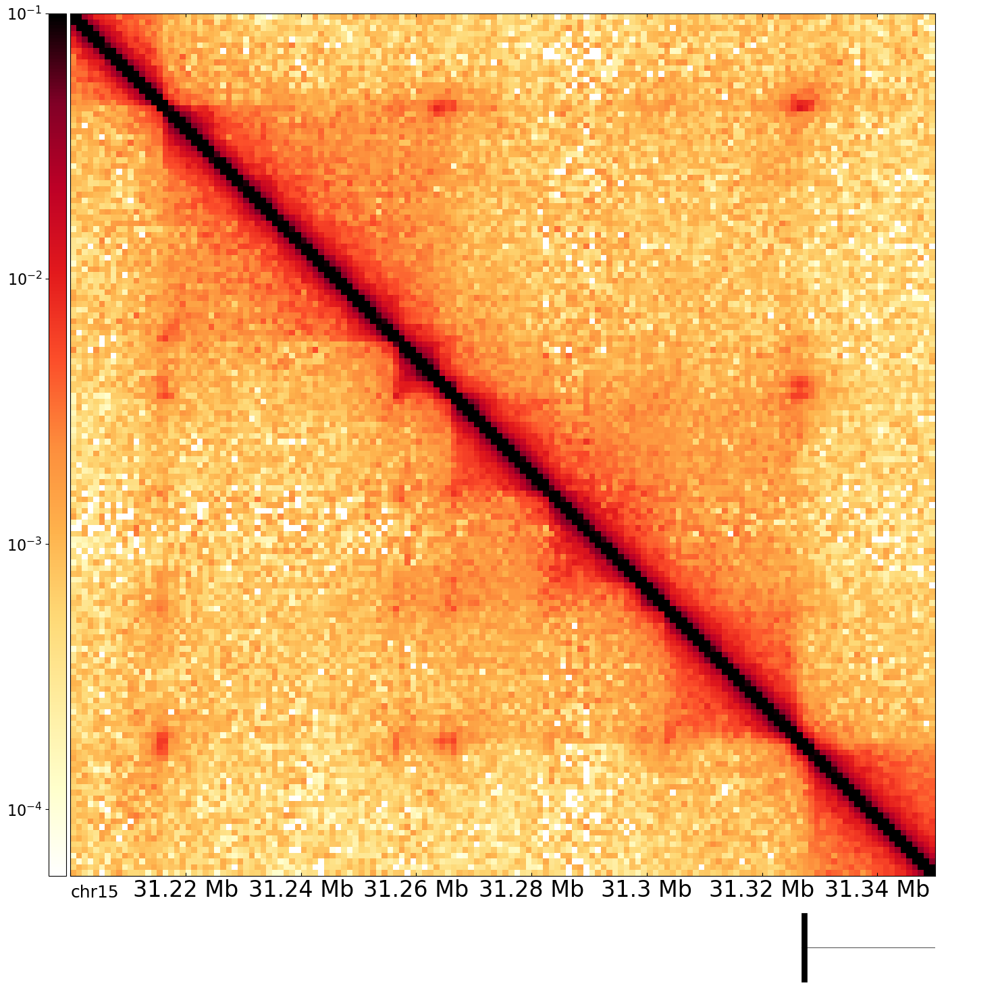

In [63]:
region_str = 'chr15:31200000-31350000'

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1,
                          "min_value":-4.25,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,file_bottom=uc_filenames[1],
                         cmap_chip="deep", autoscale=True,
                          plot_genes=True)
fig = frame.plot(region_str)
fig
#fig.savefig(os.path.join(savedir, "P12_klf13_inset.svg"))

## Supp 2: Compartments

In [ ]:
savedir = os.path.join('/mnt/md0/varshini/Analysis/Blood/figs_v2/supp2')

In [15]:
incl = []

resolution=100000
region_str = regions['compt_ex2']
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-2.0,
                          "min_value":-4.25,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,
                         file_bottom = uc_filenames[2], cmap_chip="deep", autoscale=False,
                          plot_genes=False)
fig = frame.plot(region_str)
fig.savefig(os.path.join(savedir, f"compt_ex.svg"), dpi=300)

chr1:48000000-102000000 100000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool
bar is on
32.45700000000001
37.2
You've reached the modified Cool class!
[-4 -3 -2]


In [91]:
incl = []

resolution=100000
region_str = regions['compt_ex3']
print(region_str)
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-2.0,
                          "min_value":-4.25,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,
                         file_bottom = uc_filenames[2], cmap_chip="deep", autoscale=False,
                          plot_genes=False)
fig = frame.plot(region_str)
#fig.savefig(os.path.join(savedir, f"compt_ex3.svg"), dpi=300)

chr8:93,846,768-130,070,949
chr8:93,846,768-130,070,949 100000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool
You've reached the modified Cool class!
[-4 -3 -2]


In [90]:
incl = []

resolution=10000
region_str = regions['compt_ex3_sub']
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                           "max_value":-2.5,
                          "min_value":-5,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,
                         file_bottom = uc_filenames[2], cmap_chip="deep", autoscale=False,
                          plot_genes=False)
fig = frame.plot(region_str)
fig.savefig(os.path.join(savedir, f"compt_ex3_sub.svg"), dpi=300)

chr8:93,846,768-104,070,949 10000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool
You've reached the modified Cool class!
[-5 -4 -3]


## Supp 3: Loops

chr5:173570169-174026097 1000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool


100%|██████████████████████████████████| 22438/22438 [00:00<00:00, 24251.40it/s]


You've reached the modified Cool class!
[-4 -3 -2]


DEBUG:pygenometracks.tracks.GenomeTrack:ylim 3.38,-0.08


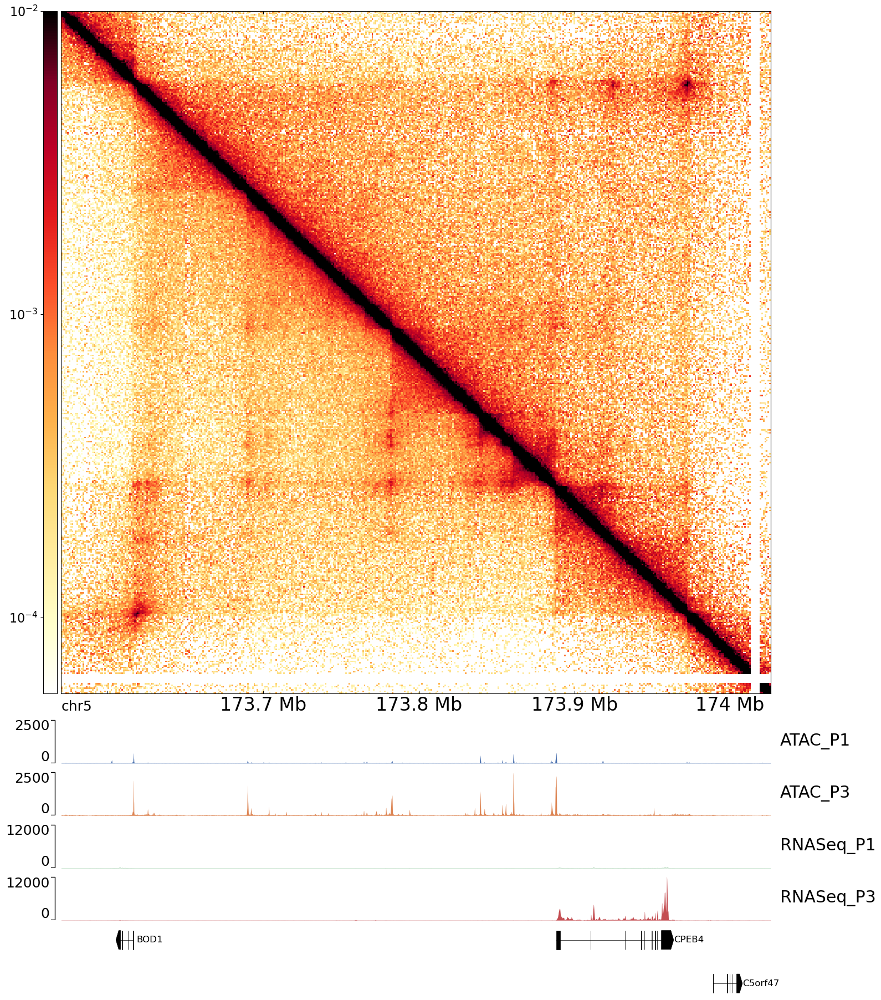

In [31]:
## CPEB4 
incl = ['ATAC_P1', 'ATAC_P3','RNASeq_P1', 'RNASeq_P3']

resolution=1000
region_str = regions['cpeb4']
GTF_PARAMS[0]["height"] = 3

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-2.0,
                          "min_value":-4.25,
                          "fontsize":18}

chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,
                         file_bottom = uc_filenames[2], cmap_chip="deep", autoscale=False,
                            custom_valranges=[2500, 2500, 12000, 12000])
fig = frame.plot(region_str)
fig
#fig.savefig(os.path.join(savedir, f"cpeb4.svg"), dpi=300)

chr11:47,343,511-47,410,593 500 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool


100%|██████████████████████████████████| 22438/22438 [00:00<00:00, 22803.97it/s]


You've reached the modified Cool class!
[-4 -3 -2]


DEBUG:pygenometracks.tracks.GenomeTrack:ylim 3.38,-0.08


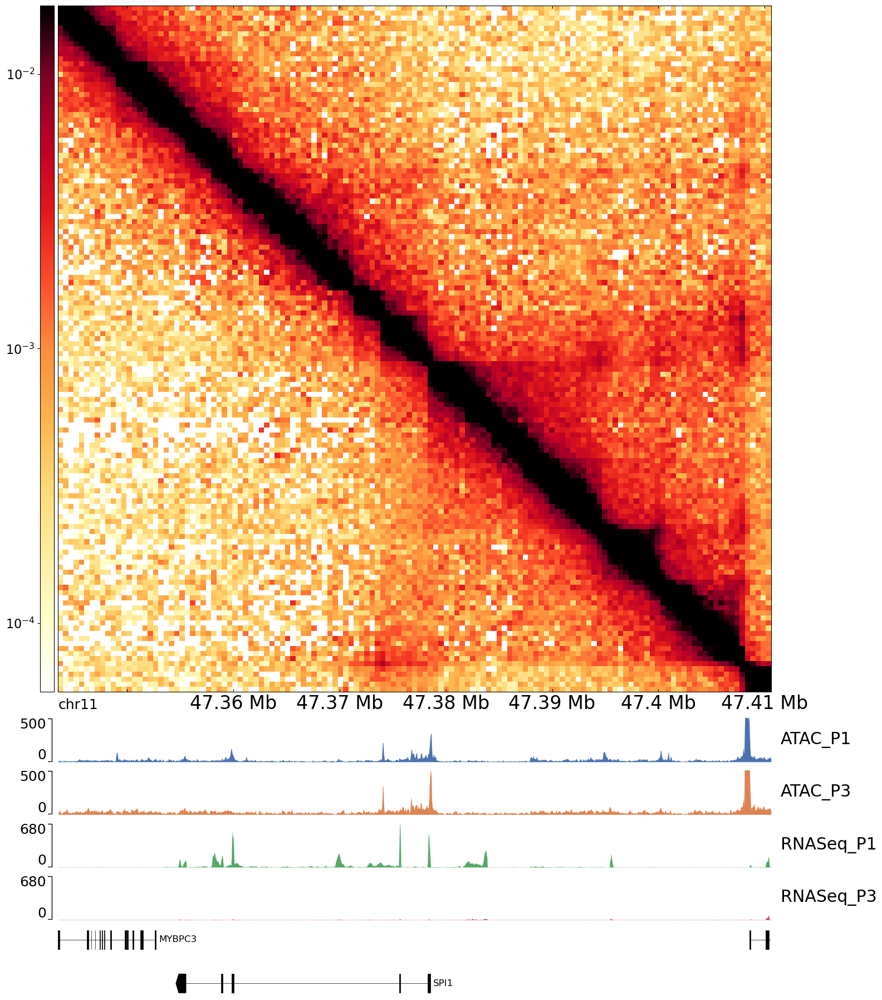

In [32]:
## SPI1

incl = ['ATAC_P1', 'ATAC_P3','RNASeq_P1', 'RNASeq_P3']

resolution=500
region_str = regions['spi1']

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1.75,
                          "min_value":-4.25,
                          "fontsize":18}
GTF_PARAMS[0]["height"] = 3
chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,
                         file_bottom = uc_filenames[2], cmap_chip="deep", autoscale=False,
                            custom_valranges=[500, 500, 680, 680])
fig = frame.plot(region_str)
fig
#fig.savefig(os.path.join(savedir, f"spi1.svg"), dpi=300)

chr16:50000-277,522 1000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool


100%|██████████████████████████████████| 22438/22438 [00:00<00:00, 24852.89it/s]


bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


DEBUG:pygenometracks.tracks.GenomeTrack:ylim 5.68,-0.08


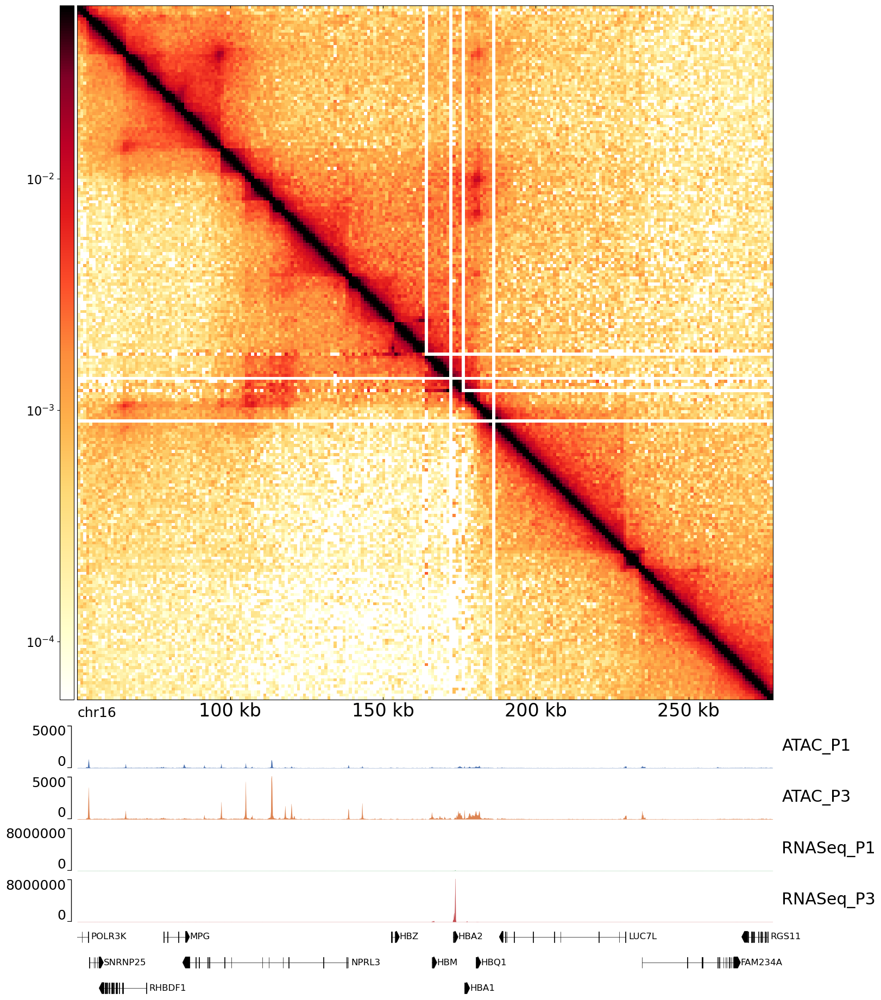

In [9]:
## alpha-globin 
incl = ['ATAC_P1', 'ATAC_P3','RNASeq_P1', 'RNASeq_P3']

resolution=1000
region_str = regions['alpha_globin']

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1.25,
                          "min_value":-4.25,
                          "fontsize":18}
GTF_PARAMS[0]["height"] = 3
chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,
                         file_bottom = uc_filenames[2], cmap_chip="deep", autoscale=False,
                            custom_valranges=[5000, 5000, 8_000_000, 8_000_000])
fig = frame.plot(region_str)
fig.savefig(os.path.join(savedir, f"alpha_globin.svg"), dpi=300)

fig

chr4:54257267-54940783 2000 /mnt/coldstorage/Varshmallow/Adipose_Blood_Merged/sankaran/Sankaran_Phase1_merged.250.mcool


100%|██████████████████████████████████| 22438/22438 [00:00<00:00, 33772.81it/s]


bar is on
32.45700000000001
37.2
You've reached the modified Cool class!


DEBUG:pygenometracks.tracks.GenomeTrack:ylim 1.08,-0.08


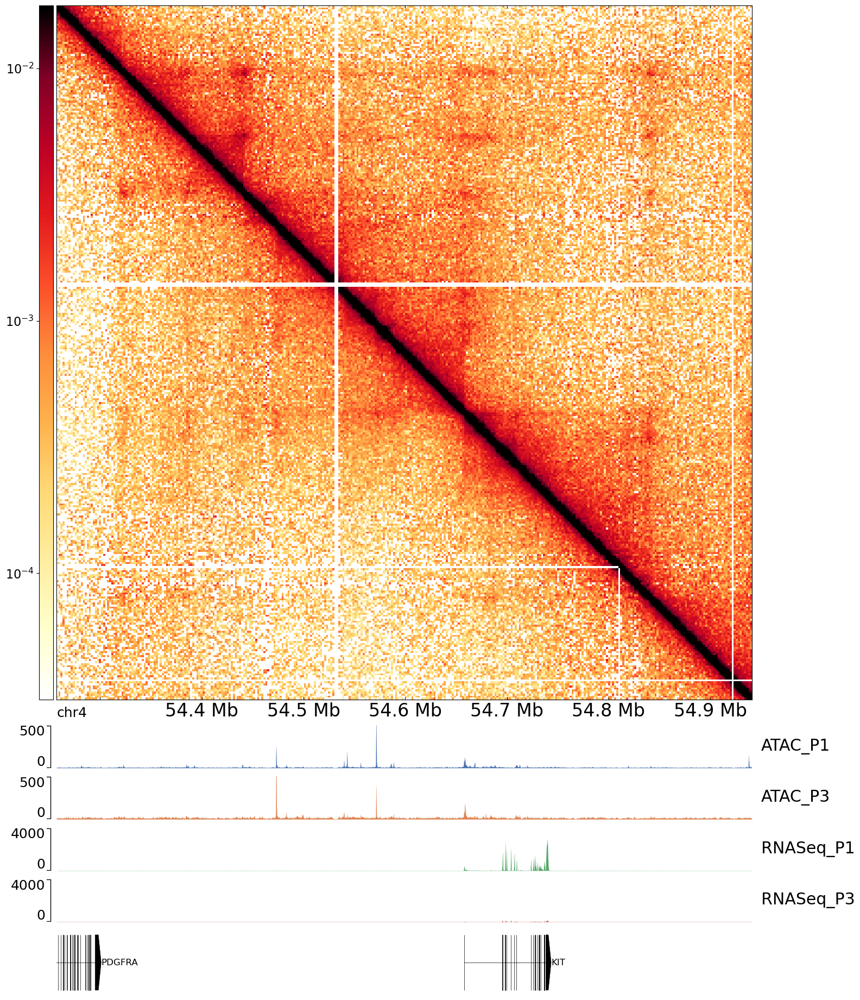

In [47]:
## c-kit 

incl = ['ATAC_P1', 'ATAC_P3','RNASeq_P1', 'RNASeq_P3']

resolution=2000
region_str = regions['ckit']

MICROC_PLOTTING_PARAMS = {"style":"matrix",
                          "transform":"log10",
                          "depth_ratio":"full",
                          "balance":True,
                          "cmap":"fall",
                          "max_value":-1.75,
                          "min_value":-4.5,
                          "fontsize":18}
GTF_PARAMS[0]["height"] = 3
chip_list = get_chip_list(include=incl, phase=1, phase2=3)
frame = make_region_plot_mod(region_str, resolution, uc_filenames[0],
                         chip_list, condition_order=incl, gene_annot_name=GTF_FILENAME,
                        bedgraph_fname=None, plot_variants=False, plot_bed=False,
                         file_bottom = uc_filenames[2], cmap_chip="deep", autoscale=False,
                            custom_valranges=[500, 500, 4000, 4000])
fig = frame.plot(region_str)
fig.savefig(os.path.join(savedir, f"kit_cd117.svg"), dpi=300)

fig

In [45]:
savedir

'/mnt/md0/varshini/Analysis/Blood/figs_v4/supp1'